# Install Dependencies


In [ ]:
# !pip install requests matplotlib Pillow psutil

# Testing script on standalone prompt


In [ ]:
import os
import io
import requests
from PIL import Image
import cv2

In [ ]:
# Add your hugging face hub token here.
os.environ['HUGGINGFACEHUB_API_TOKEN'] = "<HUGGINGFACE_TOEKN>"

In [ ]:
def text2image(prompt, model):
    HF_TOKEN = os.getenv('HUGGINGFACEHUB_API_TOKEN')
    API_URL = f"https://api-inference.huggingface.co/models/{model}"
    headers = {"Authorization": f"Bearer {HF_TOKEN}"}
    payload = {"inputs":prompt}
    response = requests.post(API_URL, headers=headers, json=payload)
    image_bytes = response.content
    image = Image.open(io.BytesIO(image_bytes))
    upscaled_image = image.resize((2048,2048))
    return upscaled_image

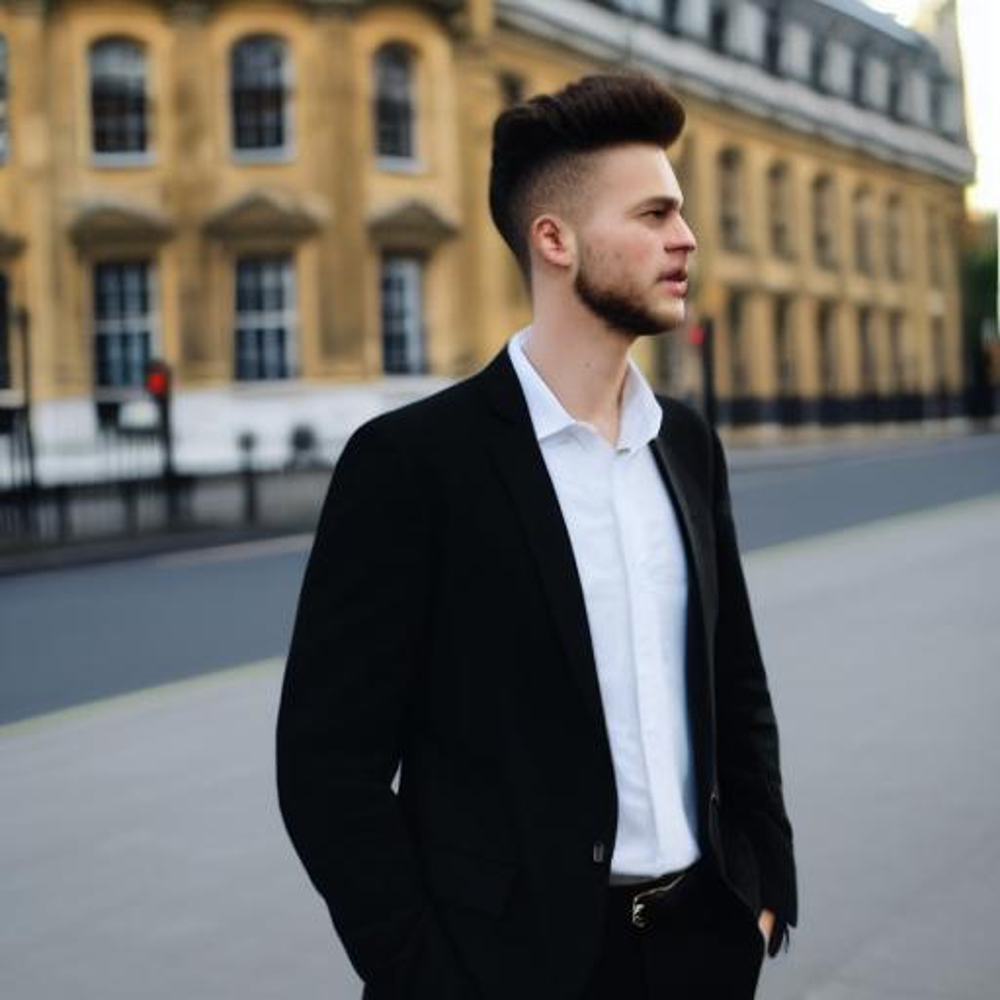

In [ ]:
text2image("A man wearning classic black blazer and posing on london street.", "runwayml/stable-diffusion-v1-5") # runwayml stable diffusion

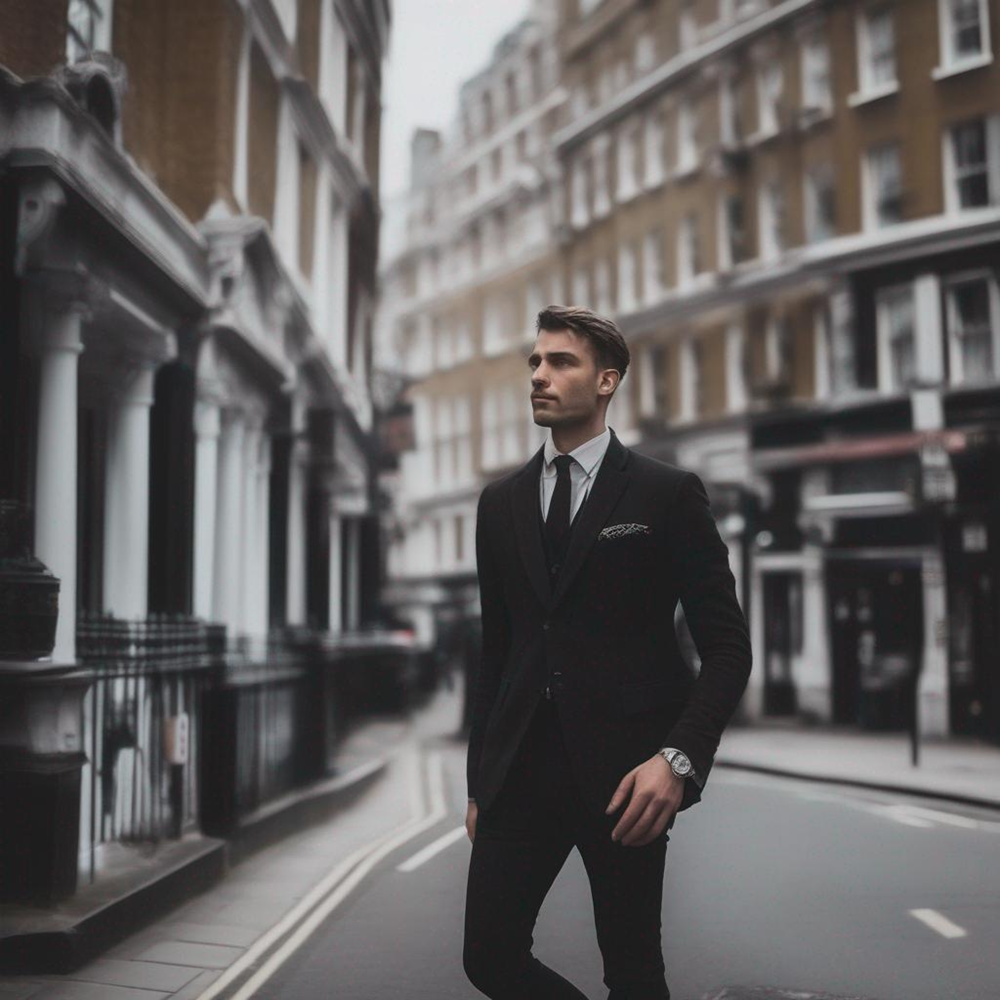

In [ ]:
text2image("A man wearning classic black blazer and posing on london street.","stabilityai/stable-diffusion-xl-base-1.0") # stabilityai stable diffusion

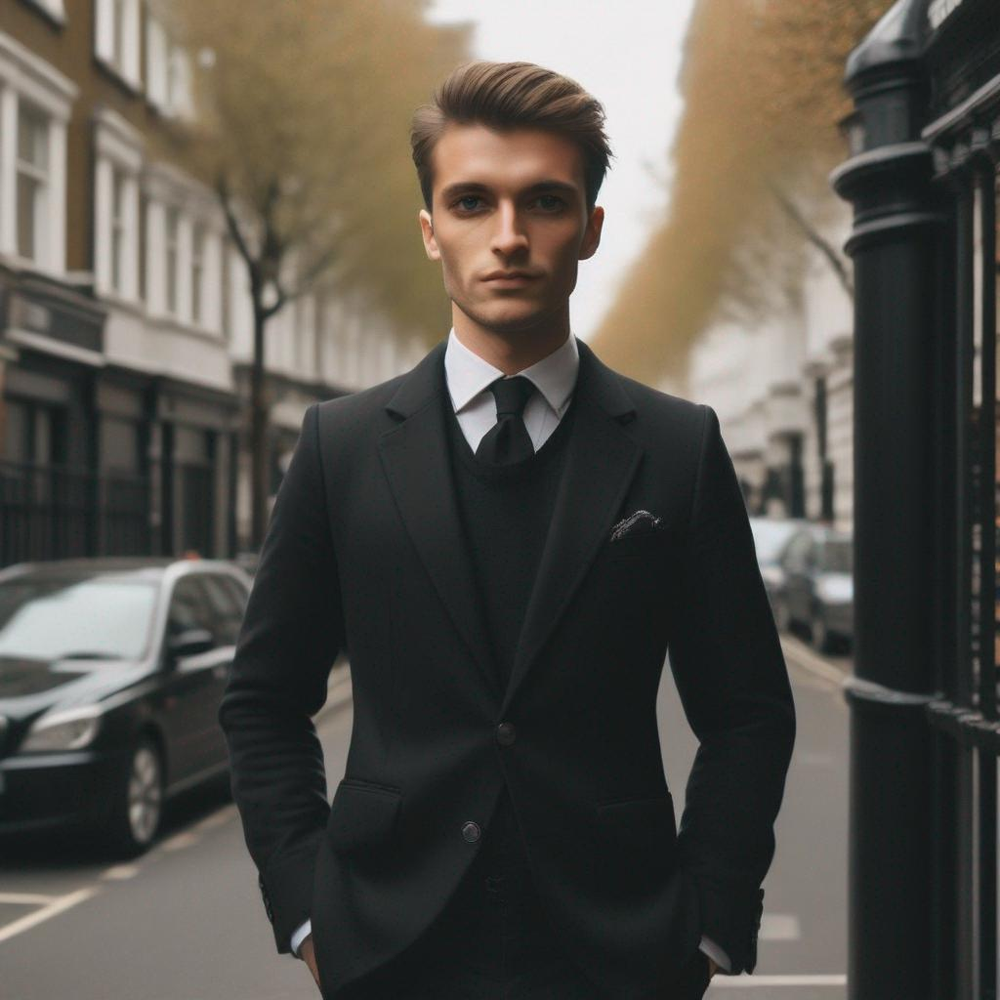

In [ ]:
text2image("A man wearning classic black blazer and posing on london street.","ehristoforu/dalle-3-xl-v2") # Dalle

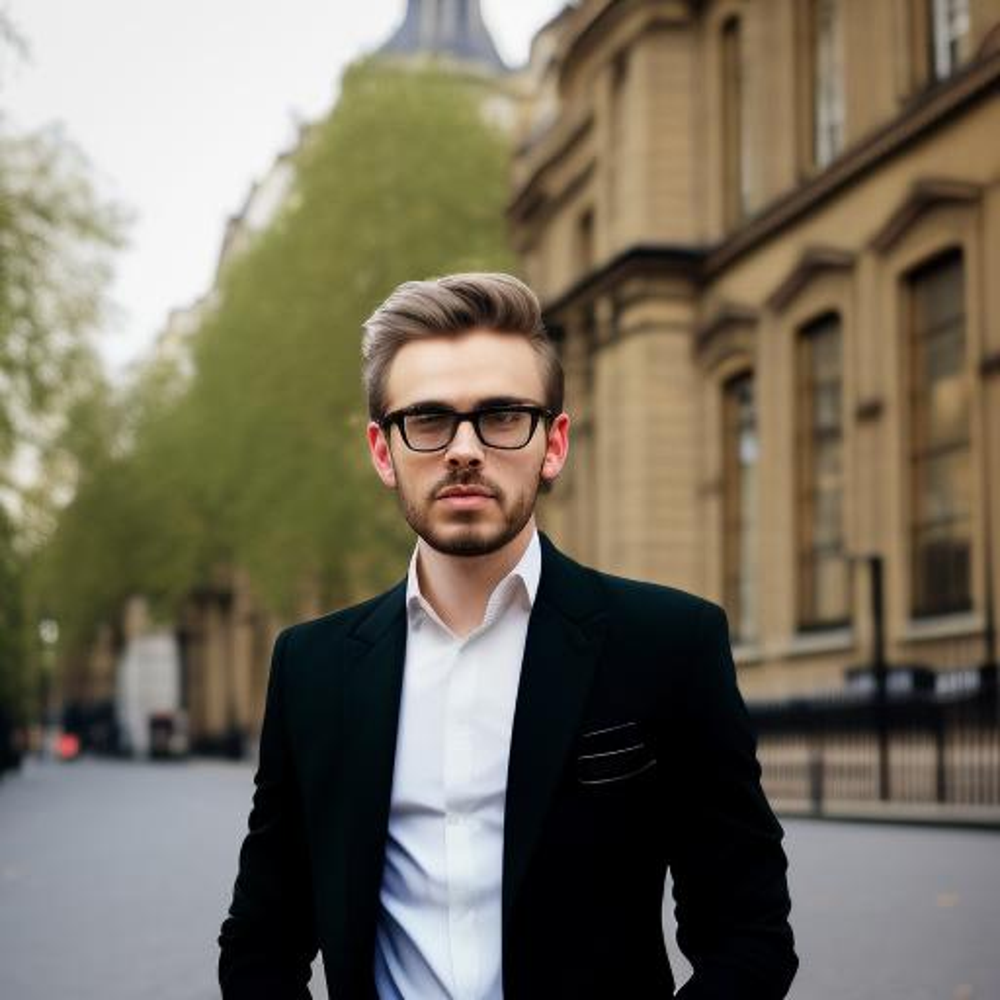

In [ ]:
text2image("A man with classic black blazer and posing on london street.","prompthero/openjourney") # Open Journey

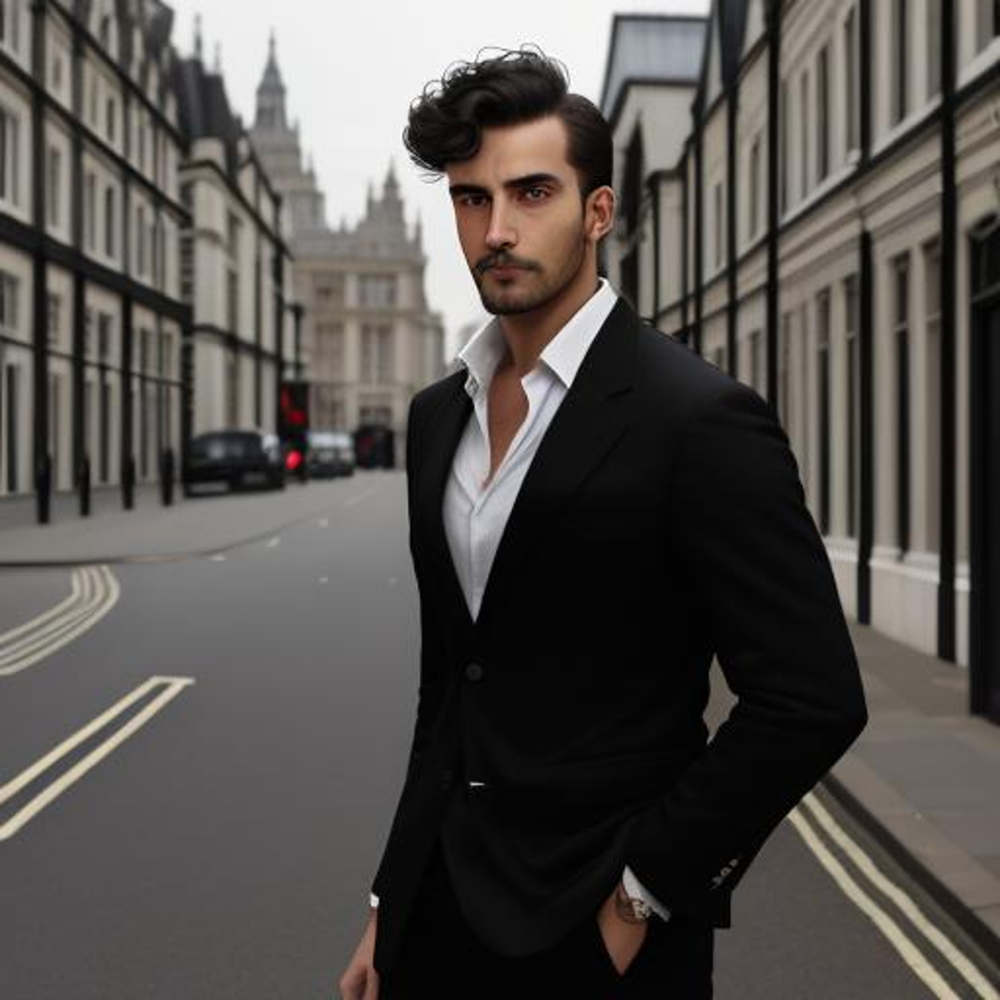

In [ ]:
text2image("A man with classic black blazer and posing on london street.","stablediffusionapi/dreamshaper-v7") # Dream Shaper

# Creating pipeline to test multiple prompts


You can run directly pipeline by executhing code from below blocks


In [ ]:
import os
import io
import requests
import time
import psutil
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import json

In [ ]:
# Add your hugging face hub token here.
os.environ['HUGGINGFACEHUB_API_TOKEN'] = "<HUGGINGFACE_TOEKN>"

In [ ]:
def text2image(prompt, model):
    HF_TOKEN = os.getenv('HUGGINGFACEHUB_API_TOKEN')
    API_URL = f"https://api-inference.huggingface.co/models/{model}"
    headers = {"Authorization": f"Bearer {HF_TOKEN}"}
    payload = {"inputs":prompt}
    response = requests.post(API_URL, headers=headers, json=payload)
    image_bytes = response.content
    image = Image.open(io.BytesIO(image_bytes))
    upscaled_image = image.resize((2048,2048))
    return upscaled_image

In [ ]:
def measure_performance(prompt, model_name, final_stats):
    print(f"MODEL: {model_name}\n\n")

    start_time = time.time()
    initial_memory = psutil.virtual_memory().used / (1024 * 1024)  # in MB
    initial_cpu = psutil.cpu_percent()

    try:
        plt.imshow(text2image(prompt, model_name))
        plt.show()
    except Exception as e:
        print(f"Error running model: {e}")
    finally:
        end_time = time.time()
        final_memory = psutil.virtual_memory().used / (1024 * 1024)  # in MB
        final_cpu = psutil.cpu_percent()
        execution_time = end_time - start_time
        memory_usage = final_memory - initial_memory
        cpu_usage = (final_cpu + initial_cpu) / 2
        final_stats[prompt][model_name]['execution_time'] = f"{execution_time:.2f} Seconds"
        final_stats[prompt][model_name]['memory_usage'] = f"{memory_usage:.2f} MB"
        final_stats[prompt][model_name]['cpu_usage'] = f"{cpu_usage:.2f} %"

> Note: **stablediffusionapi/dreamshaper-v7** -- Another model I have tried which might not work perfactly and generate cartoon like images. So thats why I have removed that model from analysis.


In [ ]:
# Model which are available through Inference API from HuggingFace

MODELS = ["runwayml/stable-diffusion-v1-5",
          "stabilityai/stable-diffusion-xl-base-1.0",
          "ehristoforu/dalle-3-xl-v2",
          "prompthero/openjourney"]

# you can also change and apply various prompts as per your  requirements. However do note sometimes model does not generate perfact 
# output so you might need to reframe the prompt.

prompts = [
    # Men's Clothing
    "Stylish young man in casual attire against urban backdrop: jeans, tee, denim jacket.",

    # Women's Clothing
    "Confident mid-20s woman in chic floral dress in sunlit garden.",

    # Boy's Clothing
    "Cheerful 8-year-old boy in colorful hoodie, denim jeans, sneakers at playground.",

    # Girl's Clothing
    "Create a vivid image of a charming, playful 6-year-old girl wearing a patterned dress, leggings, and ballet flats, inside a whimsically decorated bedroom.",

    # Kids' Clothing (Unisex)
    "Two 10-year-olds in coordinated hoodies, track pants, sneakers laughing in park."
]


In [ ]:
def test_prompts(prompt, final_stats):
    for model in MODELS:
    final_stats[prompt][model] = dict()
    print(f"PROMPT: {prompt}")
    measure_performance(prompt, model, final_stats)

PROMPT: Stylish young man in casual attire against urban backdrop: jeans, tee, denim jacket.
MODEL: runwayml/stable-diffusion-v1-5




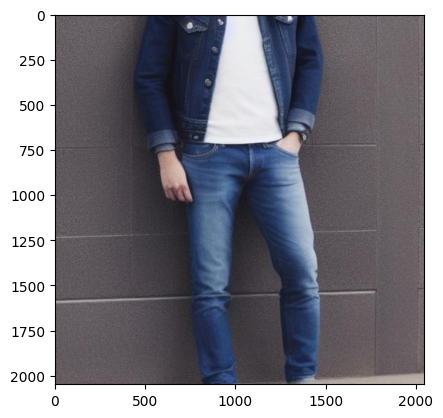

PROMPT: Stylish young man in casual attire against urban backdrop: jeans, tee, denim jacket.
MODEL: stabilityai/stable-diffusion-xl-base-1.0




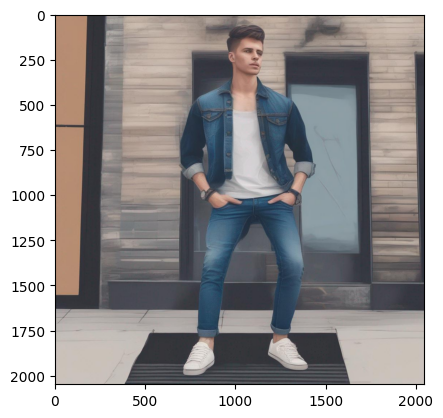

PROMPT: Stylish young man in casual attire against urban backdrop: jeans, tee, denim jacket.
MODEL: ehristoforu/dalle-3-xl-v2




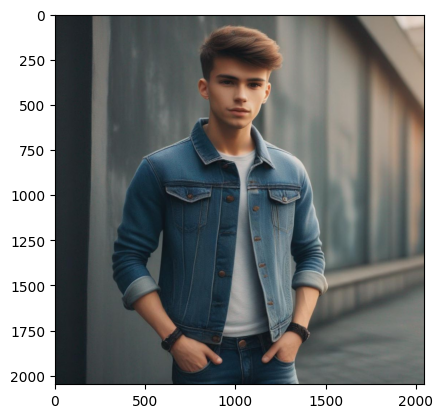

PROMPT: Stylish young man in casual attire against urban backdrop: jeans, tee, denim jacket.
MODEL: prompthero/openjourney




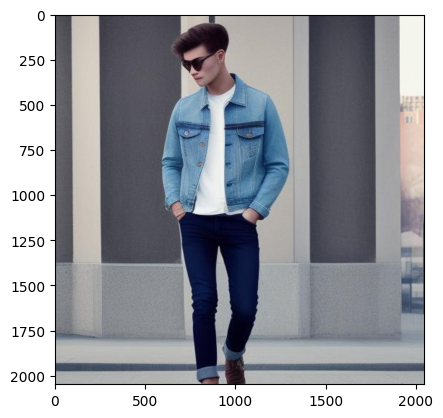

In [ ]:
# PROMPT 1
final_stats = dict() # dictonary which will store all the stats related to models.
p = prompts[0]
final_stats[p] = dict()
test_prompts(p, final_stats)

PROMPT: Confident mid-20s woman in chic floral dress in sunlit garden.
MODEL: runwayml/stable-diffusion-v1-5




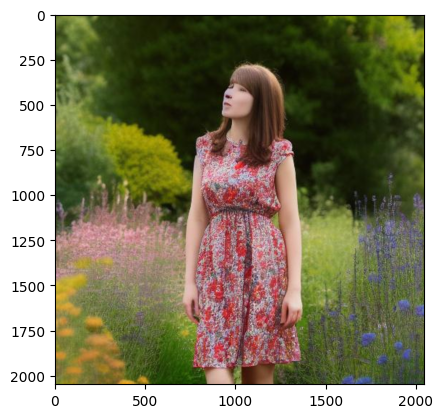

PROMPT: Confident mid-20s woman in chic floral dress in sunlit garden.
MODEL: stabilityai/stable-diffusion-xl-base-1.0




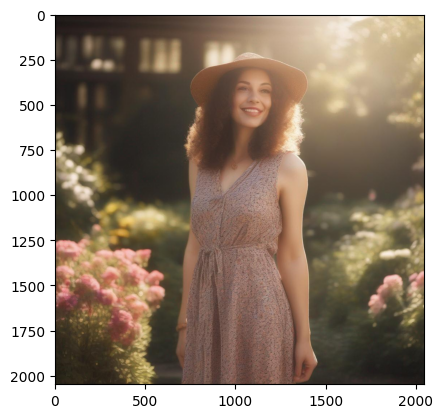

PROMPT: Confident mid-20s woman in chic floral dress in sunlit garden.
MODEL: ehristoforu/dalle-3-xl-v2




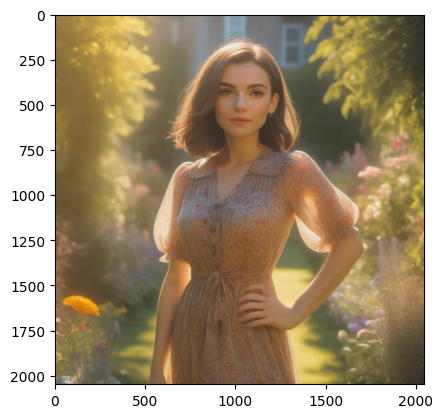

PROMPT: Confident mid-20s woman in chic floral dress in sunlit garden.
MODEL: prompthero/openjourney




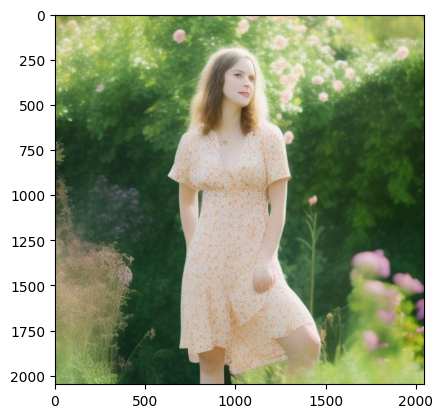

In [ ]:
# PROMPT 2
p = prompts[1]
final_stats[p] = dict()
test_prompts(p, final_stats)

PROMPT: Cheerful 8-year-old boy in colorful hoodie, denim jeans, sneakers at playground.
MODEL: runwayml/stable-diffusion-v1-5




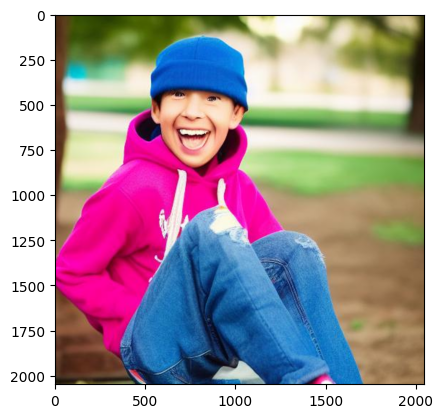

PROMPT: Cheerful 8-year-old boy in colorful hoodie, denim jeans, sneakers at playground.
MODEL: stabilityai/stable-diffusion-xl-base-1.0




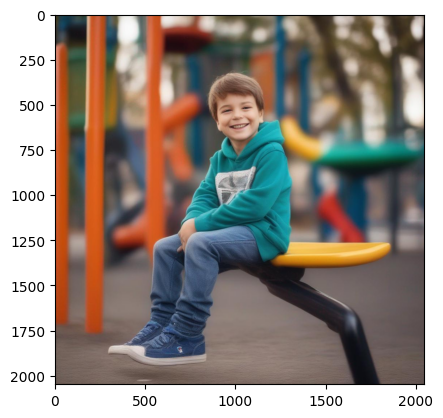

PROMPT: Cheerful 8-year-old boy in colorful hoodie, denim jeans, sneakers at playground.
MODEL: ehristoforu/dalle-3-xl-v2




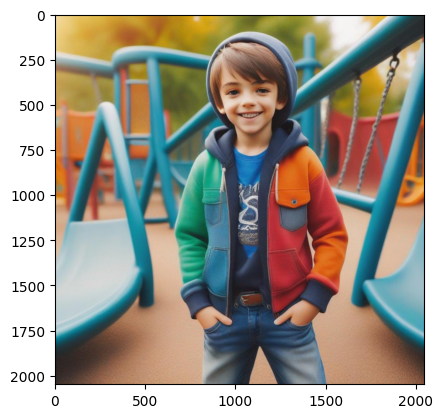

PROMPT: Cheerful 8-year-old boy in colorful hoodie, denim jeans, sneakers at playground.
MODEL: prompthero/openjourney




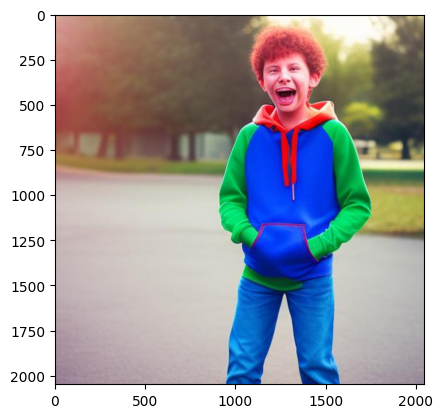

In [ ]:
# PROMPT 3
p = prompts[2]
final_stats[p] = dict()
test_prompts(p, final_stats)

PROMPT: Create a vivid image of a charming, playful 6-year-old girl wearing a patterned dress, leggings, and ballet flats, inside a whimsically decorated bedroom.
MODEL: runwayml/stable-diffusion-v1-5




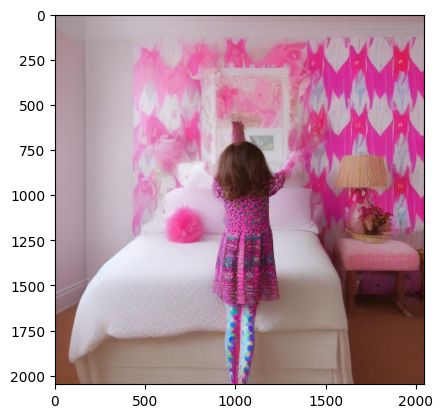

PROMPT: Create a vivid image of a charming, playful 6-year-old girl wearing a patterned dress, leggings, and ballet flats, inside a whimsically decorated bedroom.
MODEL: stabilityai/stable-diffusion-xl-base-1.0




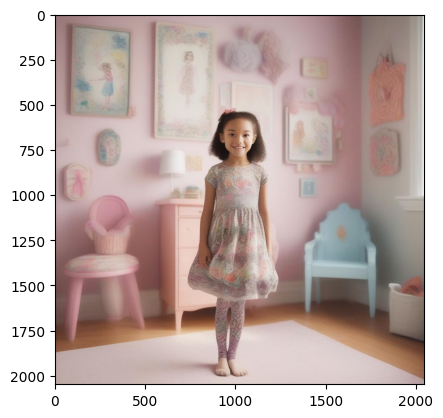

PROMPT: Create a vivid image of a charming, playful 6-year-old girl wearing a patterned dress, leggings, and ballet flats, inside a whimsically decorated bedroom.
MODEL: ehristoforu/dalle-3-xl-v2




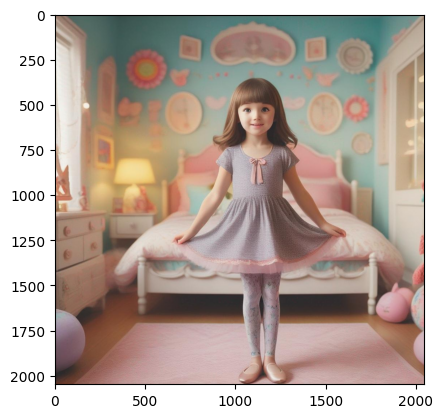

PROMPT: Create a vivid image of a charming, playful 6-year-old girl wearing a patterned dress, leggings, and ballet flats, inside a whimsically decorated bedroom.
MODEL: prompthero/openjourney




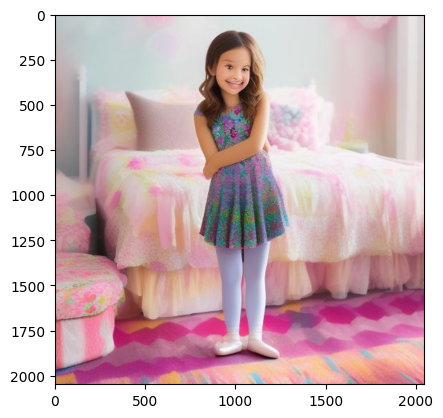

In [ ]:
# PROMPT 4
p = prompts[3]
final_stats[p] = dict()
test_prompts(p, final_stats)

PROMPT: Two 10-year-olds in coordinated hoodies, track pants, sneakers laughing in park.
MODEL: runwayml/stable-diffusion-v1-5




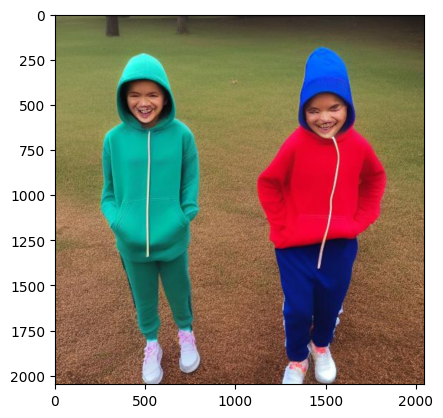

PROMPT: Two 10-year-olds in coordinated hoodies, track pants, sneakers laughing in park.
MODEL: stabilityai/stable-diffusion-xl-base-1.0




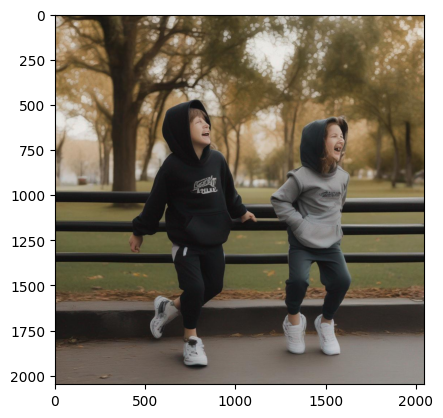

PROMPT: Two 10-year-olds in coordinated hoodies, track pants, sneakers laughing in park.
MODEL: ehristoforu/dalle-3-xl-v2




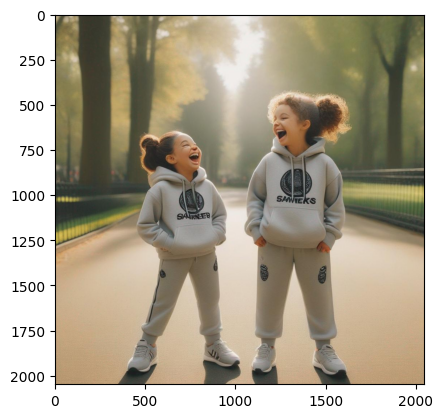

PROMPT: Two 10-year-olds in coordinated hoodies, track pants, sneakers laughing in park.
MODEL: prompthero/openjourney




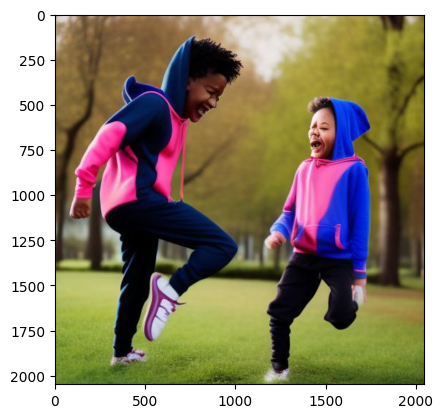

In [ ]:
# PROMPT 5
p = prompts[4]
final_stats[p] = dict()
test_prompts(p, final_stats)

### Save the stats into JSON file.


In [ ]:
# Save the stats into local storage.
with open("final_stats.json", 'w') as f:
  json.dump(final_stats,f)

For detailed analysis and model exploration I have attached my `final_stats.json`and `OpenSource Diffusion Models Analysis Report.pdf` in this folder from which you can read all the analysis from my side.


---
